In [246]:
import sys
sys.path.append('/orange/adamginsburg/ALMA_IMF/reduction/analysis')
from spectralindex import prefixes
from astropy.visualization import simple_norm
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
from mpl_toolkits.axes_grid1.inset_locator import TransformedBbox, BboxPatch, BboxConnector
import astropy.visualization.wcsaxes
from spectral_cube import SpectralCube

In [247]:
import warnings

In [248]:
%matplotlib inline
import pylab as pl

In [249]:
os.chdir('/orange/adamginsburg/ALMA_IMF/2017.1.01355.L/February2021Release/')

In [250]:
    prefixes['W43MM1'] = dict(
        finaliter_prefix_b3="W43-MM1/B3/cleanest/W43-MM1_B3_uid___A001_X1296_X1af_continuum_merged_12M_robust0_selfcal4_finaliter",
        finaliter_prefix_b6="W43-MM2/B6/cleanest/W43-MM2_B6_uid___A001_X1296_X113_continuum_merged_12M_robust0_selfcal5_finaliter",)

In [251]:
prefixes.keys()

dict_keys(['G328', 'G333', 'G12', 'W51IRS2', 'G008', 'G327', 'G10', 'G337', 'G338', 'G351', 'G353', 'W43MM3', 'W43MM2', 'W51-E', 'W43MM1'])

In [252]:
zoom_parameters = {}
zoom_parameters[('G008', 'B3')] = [{'xl':1500, 'xr':1900, 'yl':600, 'yu':1000, 
                                    'inset_pars':{'loc': 1, 'width':3, 'height':3,},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.995, 'min_percent': 0, 'stretch':'log'}
                                   },
                                   {'xl':700, 'xr':850, 'yl':1025, 'yu':1175, 
                                    'inset_pars':{'loc': 3, 'width':3, 'height':3,},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.9, 'min_percent': 2, 'stretch':'linear'}
                                   },
                                  ]

In [253]:
def make_zoom(fieldid, zoom_parameters,
              overview_vis_pars={'max_percent':99.5, 'min_percent':0.5, 'stretch':'linear'},
              overview_cmap='gray_r',
              inset_cmap='inferno',
              band='B3'):
    
    pfxs = prefixes[fieldid]

    finaliter_prefix = pfxs[f'finaliter_prefix_{band}'.lower()]
    image = SpectralCube.read(f'{finaliter_prefix}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

    fig = pl.figure(figsize=(12,12))

    fig = pl.figure(1, figsize=(10,10))
    fig.clf()
    ax = fig.add_subplot(projection=image.wcs.celestial)

    img = image[0].value
    norm = simple_norm(img, **overview_vis_pars)
    ax.imshow(img, cmap=overview_cmap, norm=norm)

    tick_fontsize=16
    ra = ax.coords['ra']
    ra.set_major_formatter('hh:mm:ss.s')
    dec = ax.coords['dec']
    ra.set_axislabel("RA (J2000)", fontsize=20)
    dec.set_axislabel("Dec (J2000)", fontsize=20, minpad=0.0)
    ra.ticklabels.set_fontsize(tick_fontsize)
    ra.set_ticks(exclude_overlapping=True)
    dec.ticklabels.set_fontsize(tick_fontsize)
    dec.set_ticks(exclude_overlapping=True)

    for zp in zoom_parameters:

        xl,xr = zp['xl'], zp['xr']
        yl,yu = zp['yl'], zp['yu']
        slc = [slice(yl,yu), slice(xl,xr)]
        axins = inset_axes(ax, **zp['inset_pars'],
                           axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                           axes_kwargs=dict(wcs=image[0][slc].wcs.celestial))

        norm2 = simple_norm(img, **zp['vis_pars'])

        axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap=inset_cmap, norm=norm2)
        mark_inset(parent_axes=ax, inset_axes=axins,
                   fc="none", ec="b", **zp['mark_inset_pars'])
        ra = axins.coords['ra']
        dec = axins.coords['dec']
        axins.set_xticklabels([])
        axins.set_yticklabels([])
        axins.xaxis.set_visible(False)
        axins.yaxis.set_visible(False)
        ra.set_ticks_visible(False)
        dec.set_ticks_visible(False)
        ra.set_axislabel('')
        dec.set_axislabel('')
        ra.ticklabels.set_visible(False)
        dec.ticklabels.set_visible(False)

    pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms_{band}.png', bbox_inches='tight')
    pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms_{band}.pdf', bbox_inches='tight')

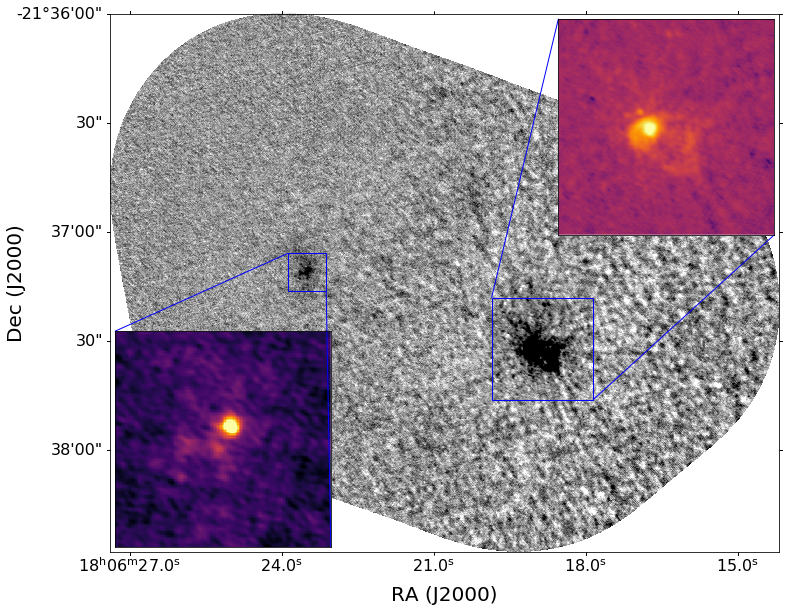

In [254]:
make_zoom('G008', zoom_parameters[('G008', 'B3')])

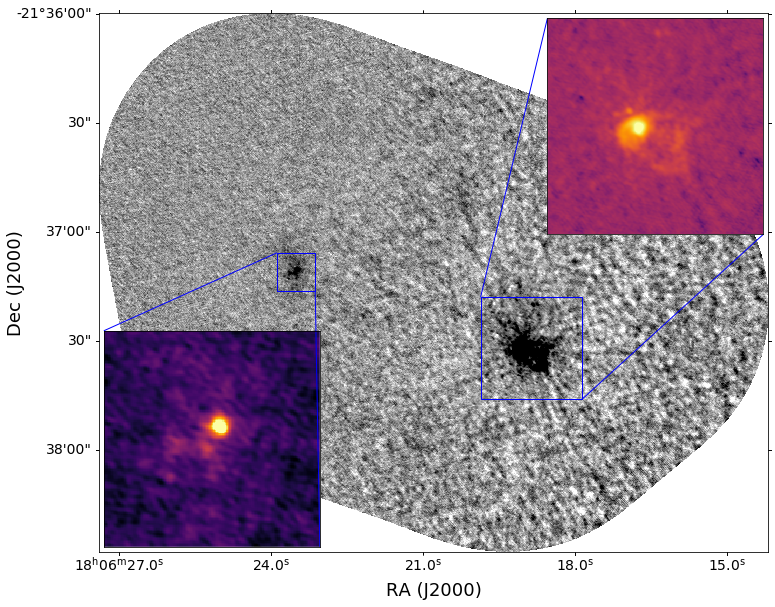

In [255]:
fieldid = 'G008'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 1500,1900
yl,yu = 600,1000
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='log')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (700,850)
by,ty = (1025,1175)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.9, min_percent=2, stretch='linear')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)



pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms_B3.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms_B3.pdf', bbox_inches='tight')

fieldid = 'G338'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 1050,1300
yl,yu = 1050,1300
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (1050,1350)
by,ty = (575,875)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms_B3.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms_B3.pdf', bbox_inches='tight')

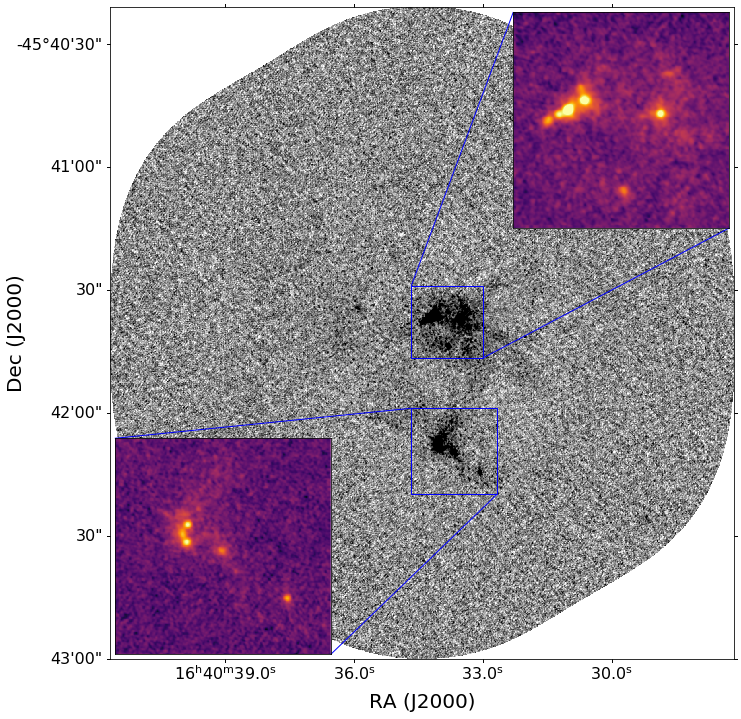

In [256]:
zoom_parameters[('G338', 'B3')] = [{'xl':1050, 'xr':1300, 'yl':1050, 'yu':1300, 
                                    'inset_pars':{'loc': 1, 'width':3, 'height':3,},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.995, 'min_percent': 0, 'stretch':'asinh'}
                                   },
                                   {'xl':1050, 'xr':1350, 'yl':575, 'yu':875, 
                                    'inset_pars':{'loc': 3, 'width':3, 'height':3,},
                                    'mark_inset_pars':{'loc1':2, 'loc2':4,},
                                    'vis_pars':{'max_percent':99.995, 'min_percent': 0, 'stretch':'asinh'}
                                   },
                                  ]
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    make_zoom('G338', zoom_parameters[('G338', 'B3')])

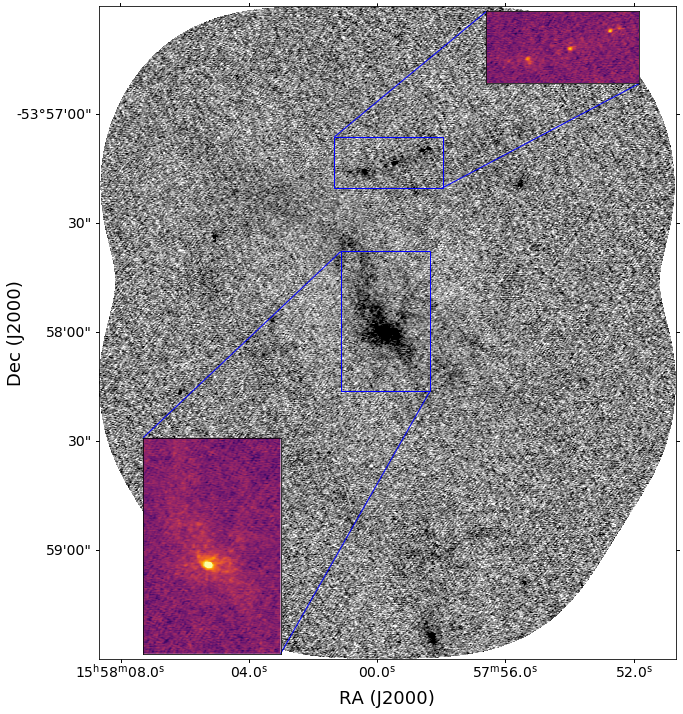

In [257]:
fieldid = 'G328'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 925,1350
yl,yu = 1850,2050
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=1,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = 950,1300
by,ty = 1050,1600
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms_B3.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms_B3.pdf', bbox_inches='tight')

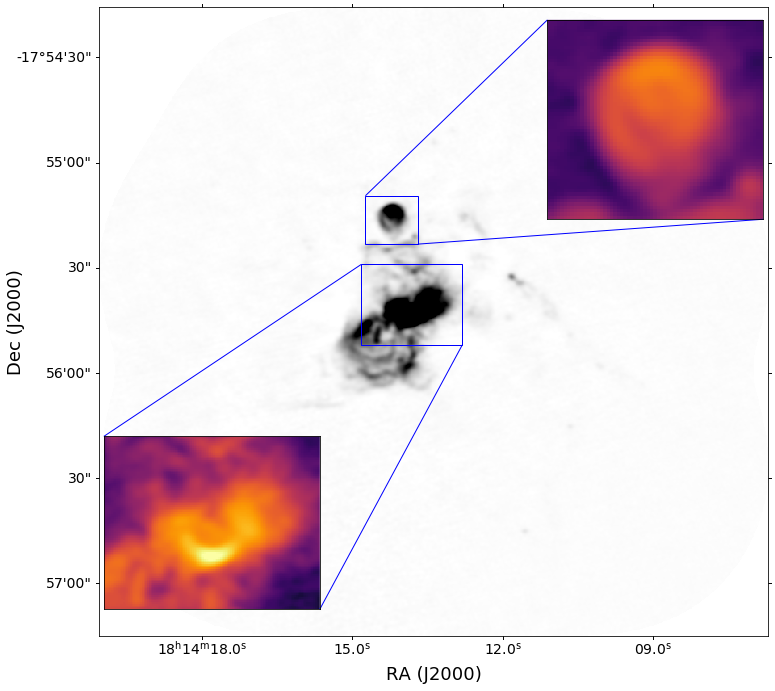

In [258]:
fieldid = 'G12'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 330,395
yl,yu = 485,545
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='log')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (325,450)
by,ty = (360,460)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='log')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

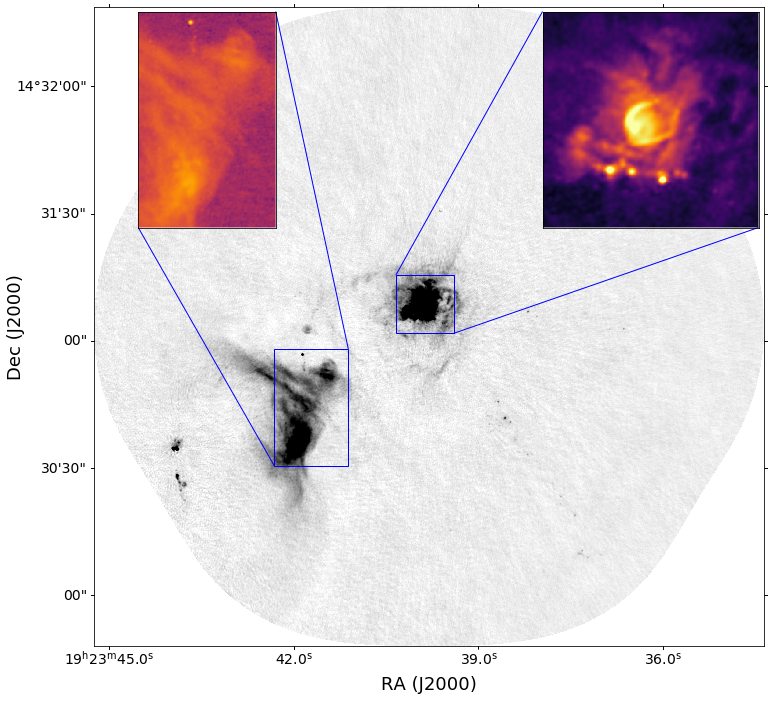

In [259]:
fieldid = 'W51IRS2'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 1425,1700
yl,yu = 1475,1750
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (850,1200)
by,ty = (850,1400)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=2, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='log')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=1, loc2=3, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

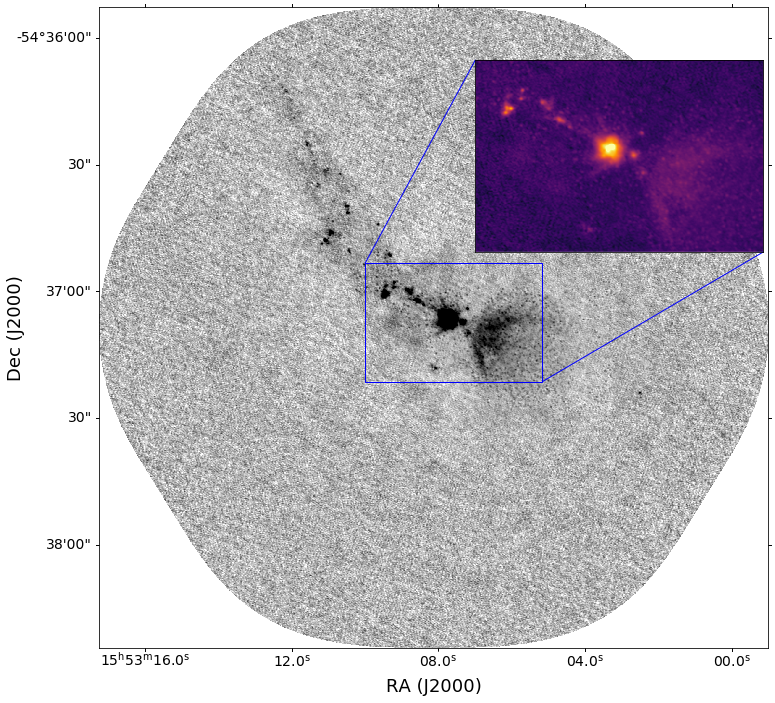

In [260]:
fieldid = 'G327'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.8, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 900,1500
yl,yu = 900,1300
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=4, height=4,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


# bx,tx = (1050,1350)
# by,ty = (575,875)
# slc = [slice(by,ty), slice(bx,tx)]
# axins = inset_axes(ax, loc=3, width=3, height=3,
#                    axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
#                    axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
# norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
# axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
# mark_inset(parent_axes=ax, inset_axes=axins,
#            loc1=2, loc2=4, fc="none", ec="b")
# ra = axins.coords['ra']
# dec = axins.coords['dec']
# axins.set_xticklabels([])
# axins.set_yticklabels([])
# axins.xaxis.set_visible(False)
# axins.yaxis.set_visible(False)
# ra.set_ticks_visible(False)
# dec.set_ticks_visible(False)
# ra.set_axislabel('')
# dec.set_axislabel('')
# ra.ticklabels.set_visible(False)
# dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

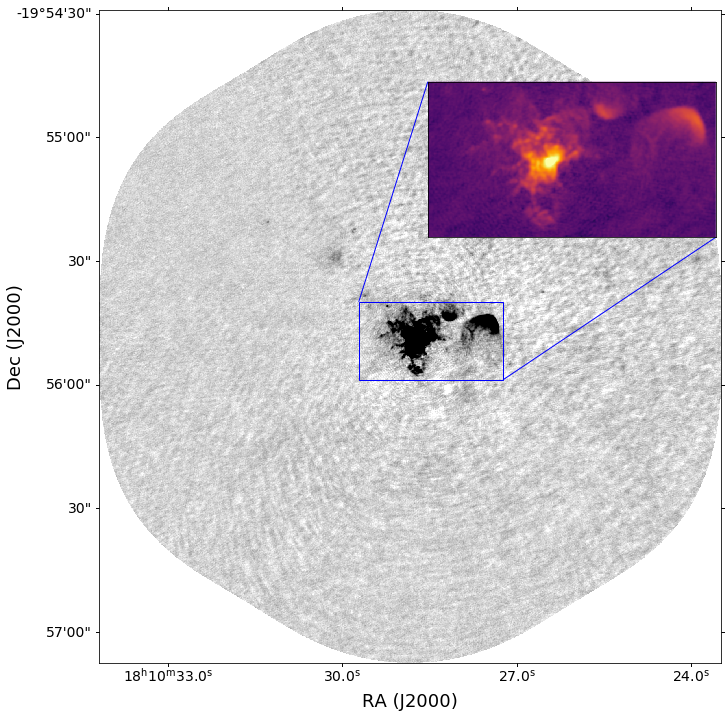

In [261]:
fieldid = 'G10'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 900,1400
yl,yu = 980,1250
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=4, height=4,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='log')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


#bx,tx = (1050,1350)
#by,ty = (575,875)
#slc = [slice(by,ty), slice(bx,tx)]
#axins = inset_axes(ax, loc=3, width=3, height=3,
#                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
#                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
#norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
#axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
#mark_inset(parent_axes=ax, inset_axes=axins,
#           loc1=2, loc2=4, fc="none", ec="b")
#ra = axins.coords['ra']
#dec = axins.coords['dec']
#axins.set_xticklabels([])
#axins.set_yticklabels([])
#axins.xaxis.set_visible(False)
#axins.yaxis.set_visible(False)
#ra.set_ticks_visible(False)
#dec.set_ticks_visible(False)
#ra.set_axislabel('')
#dec.set_axislabel('')
#ra.ticklabels.set_visible(False)
#dec.ticklabels.set_visible(False)

pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

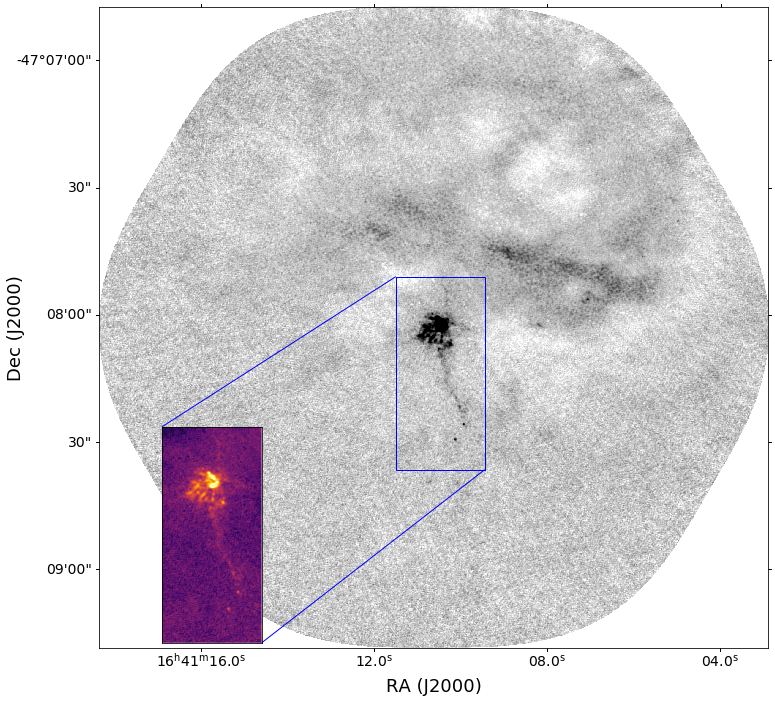

In [262]:
fieldid = 'G337'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.9, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



#xl,xr = 1050,1300
#yl,yu = 1050,1300
#slc = [slice(yl,yu), slice(xl,xr)]
#axins = inset_axes(ax, loc=1, width=3, height=3,
#                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
#                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
#
#norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
#
#axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
#mark_inset(parent_axes=ax, inset_axes=axins,
#           loc1=2, loc2=4, fc="none", ec="b")
#ra = axins.coords['ra']
#dec = axins.coords['dec']
#axins.set_xticklabels([])
#axins.set_yticklabels([])
#axins.xaxis.set_visible(False)
#axins.yaxis.set_visible(False)
#ra.set_ticks_visible(False)
#dec.set_ticks_visible(False)
#ra.set_axislabel('')
#dec.set_axislabel('')
#ra.ticklabels.set_visible(False)
#dec.ticklabels.set_visible(False)


bx,tx = (1000,1300)
by,ty = (600,1250)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.99, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

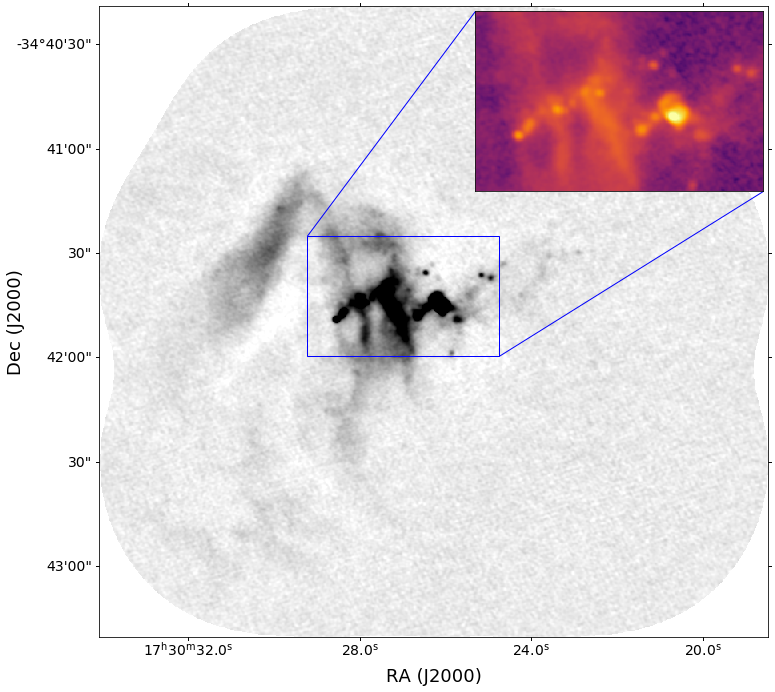

In [263]:
fieldid = 'G353'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 260,500
yl,yu = 350,500
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=4, height=2.5,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='log')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


#bx,tx = (1050,1350)
#by,ty = (575,875)
#slc = [slice(by,ty), slice(bx,tx)]
#axins = inset_axes(ax, loc=3, width=3, height=3,
#                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
#                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
#norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
#axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
#mark_inset(parent_axes=ax, inset_axes=axins,
#           loc1=2, loc2=4, fc="none", ec="b")
#ra = axins.coords['ra']
#dec = axins.coords['dec']
#axins.set_xticklabels([])
#axins.set_yticklabels([])
#axins.xaxis.set_visible(False)
#axins.yaxis.set_visible(False)
#ra.set_ticks_visible(False)
#dec.set_ticks_visible(False)
#ra.set_axislabel('')
#dec.set_axislabel('')
#ra.ticklabels.set_visible(False)
#dec.ticklabels.set_visible(False)

pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

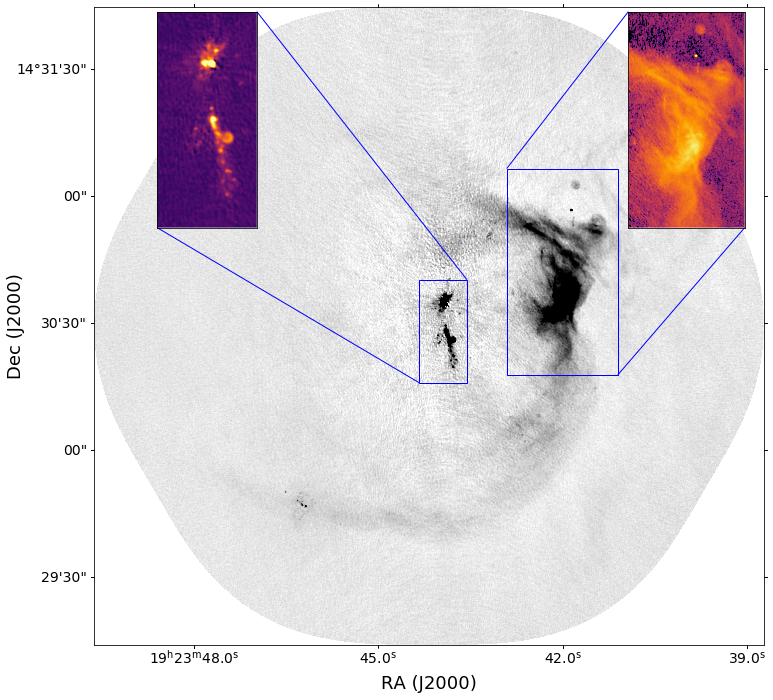

In [264]:
fieldid = 'W51-E'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 2600,3300
yl,yu = 1700,3000
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=2, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.99, min_percent=1, stretch='log')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (2050,2350)
by,ty = (1650,2300)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=2, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=1, loc2=3, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

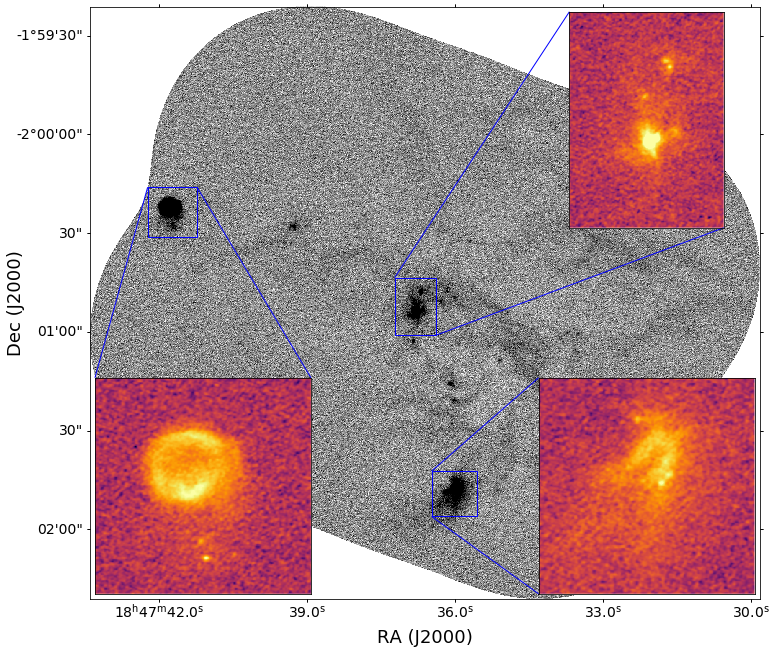

In [265]:
fieldid = 'W43MM2'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 1850,2100
yl,yu = 1600,1950
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (2075,2350)
by,ty = (500,775)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=4, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=3, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (350,650)
by,ty = (2200,2500)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=1, loc2=2, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)



pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

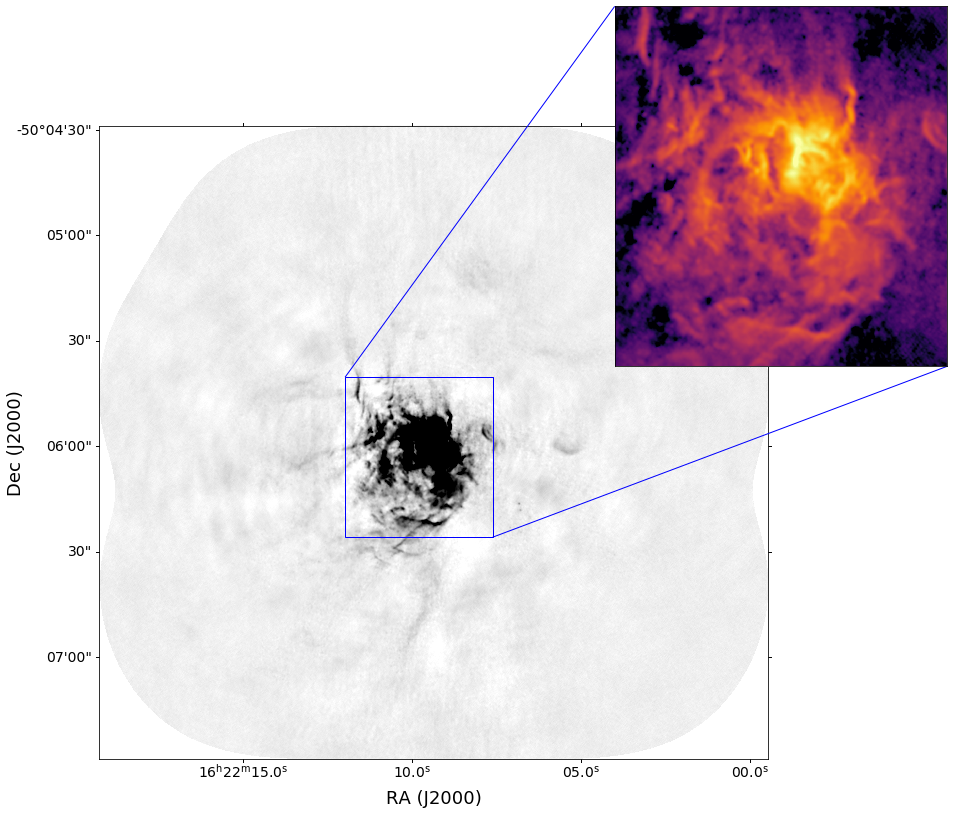

In [266]:
fieldid = 'G333'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99., min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 1000,1600
yl,yu = 900,1550
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=5, height=5,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial),
                   bbox_to_anchor=(675,575,300,300),
                  )

norm2 = simple_norm(img, max_percent=99.995, min_percent=1, stretch='log')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


#bx,tx = (1275,1500)
#by,ty = (1225,1450)
#slc = [slice(by,ty), slice(bx,tx)]
#axins = inset_axes(ax, loc=3, width=3, height=3,
#                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
#                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
#norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
#axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
#mark_inset(parent_axes=ax, inset_axes=axins,
#           loc1=2, loc2=4, fc="none", ec="b")
#ra = axins.coords['ra']
#dec = axins.coords['dec']
#axins.set_xticklabels([])
#axins.set_yticklabels([])
#axins.xaxis.set_visible(False)
#axins.yaxis.set_visible(False)
#ra.set_ticks_visible(False)
#dec.set_ticks_visible(False)
#ra.set_axislabel('')
#dec.set_axislabel('')
#ra.ticklabels.set_visible(False)
#dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms_B3.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms_B3.pdf', bbox_inches='tight')

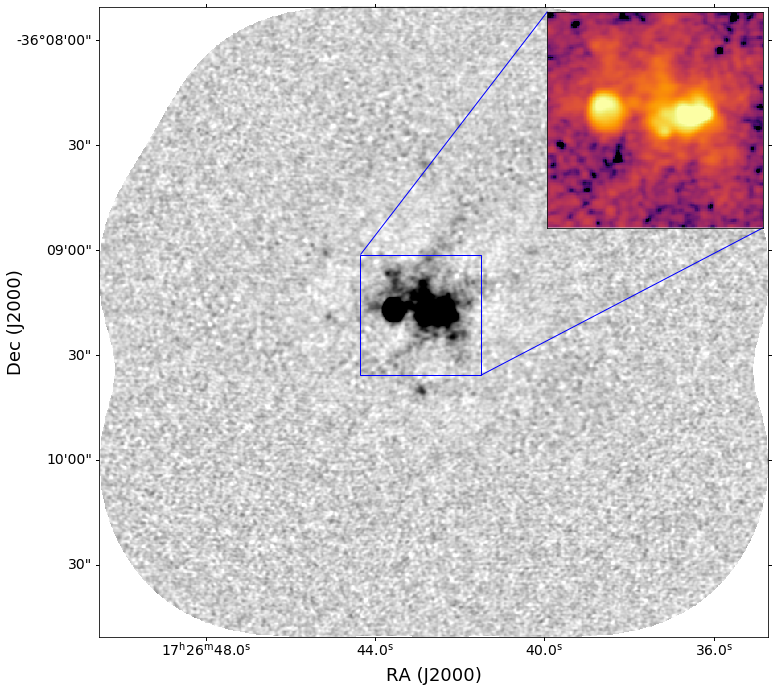

In [267]:
fieldid = 'G351'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 325,475
yl,yu = 325,475
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.95, min_percent=1, stretch='log')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


#bx,tx = (400,600)
#by,ty = (500,750)
#slc = [slice(by,ty), slice(bx,tx)]
#axins = inset_axes(ax, loc=3, width=3, height=3,
#                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
#                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
#norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
#axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
#mark_inset(parent_axes=ax, inset_axes=axins,
#           loc1=2, loc2=4, fc="none", ec="b")
#ra = axins.coords['ra']
#dec = axins.coords['dec']
#axins.set_xticklabels([])
#axins.set_yticklabels([])
#axins.xaxis.set_visible(False)
#axins.yaxis.set_visible(False)
#ra.set_ticks_visible(False)
#dec.set_ticks_visible(False)
#ra.set_axislabel('')
#dec.set_axislabel('')
#ra.ticklabels.set_visible(False)
#dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

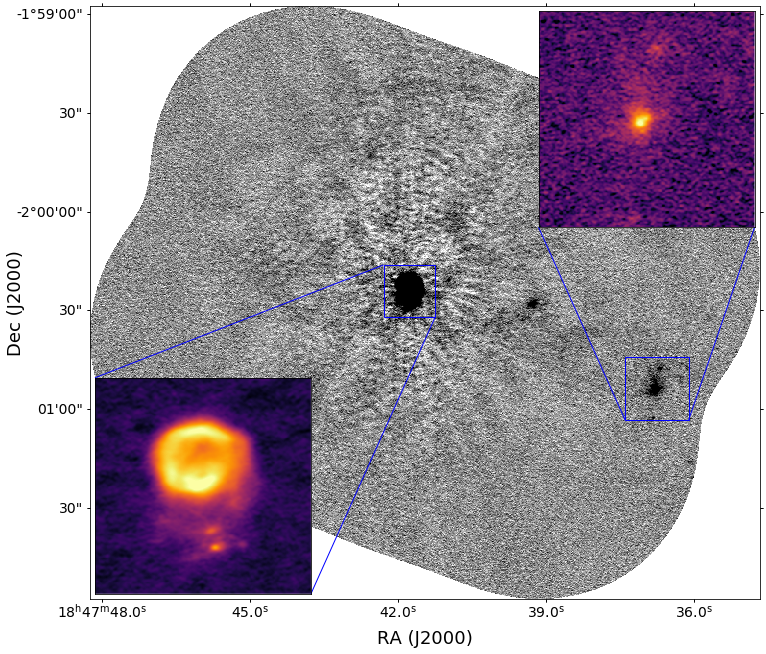

In [268]:
fieldid = 'W43MM3'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 2325,2600
yl,yu = 775,1050
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.87, min_percent=1, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=3, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (1275,1500)
by,ty = (1225,1450)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.995, min_percent=0, stretch='asinh')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

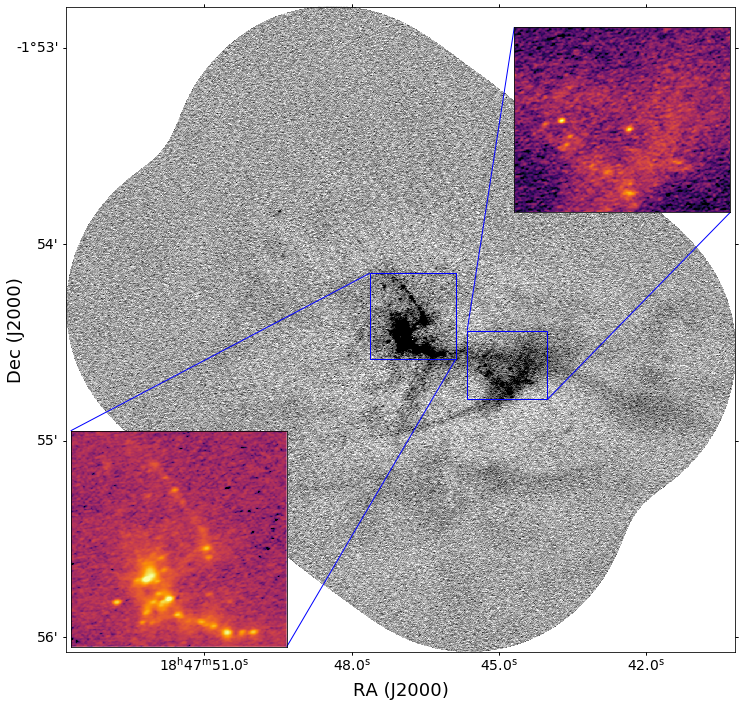

In [269]:
fieldid = 'W43MM1'
pfxs = prefixes[fieldid]

finaliter_prefix_b3 = pfxs['finaliter_prefix_b3']
image_b3 = SpectralCube.read(f'{finaliter_prefix_b3}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube()

fig = pl.figure(figsize=(12,12))

fig = pl.figure(1, figsize=(10,10))
fig.clf()
ax = fig.add_subplot(projection=image_b3.wcs.celestial)

img = image_b3[0].value
norm = simple_norm(img, max_percent=99.5, min_percent=0.5, stretch='linear')
ax.imshow(img, cmap='gray_r', norm=norm)



tick_fontsize=14
ra = ax.coords['ra']
ra.set_major_formatter('hh:mm:ss.s')
dec = ax.coords['dec']
ra.set_axislabel("RA (J2000)", fontsize=18)
dec.set_axislabel("Dec (J2000)", fontsize=18, minpad=0.0)
ra.ticklabels.set_fontsize(tick_fontsize)
ra.set_ticks(exclude_overlapping=True)
dec.ticklabels.set_fontsize(tick_fontsize)
dec.set_ticks(exclude_overlapping=True)



xl,xr = 1750,2100
yl,yu = 1100,1400
slc = [slice(yl,yu), slice(xl,xr)]
axins = inset_axes(ax, loc=1, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))

norm2 = simple_norm(img, max_percent=99.95, min_percent=1, stretch='asinh')

axins.imshow(img[slc], extent=[xl,xr,yl,yu], cmap='inferno', norm=norm2)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


bx,tx = (1325,1700)
by,ty = (1275,1650)
slc = [slice(by,ty), slice(bx,tx)]
axins = inset_axes(ax, loc=3, width=3, height=3,
                   axes_class=astropy.visualization.wcsaxes.core.WCSAxes,
                   axes_kwargs=dict(wcs=image_b3[0][slc].wcs.celestial))
norm3 = simple_norm(img, max_percent=99.998, min_percent=0.2, stretch='log')
axins.imshow(img[slc], extent=[bx,tx,by,ty], cmap='inferno', norm=norm3)
mark_inset(parent_axes=ax, inset_axes=axins,
           loc1=2, loc2=4, fc="none", ec="b")
ra = axins.coords['ra']
dec = axins.coords['dec']
axins.set_xticklabels([])
axins.set_yticklabels([])
axins.xaxis.set_visible(False)
axins.yaxis.set_visible(False)
ra.set_ticks_visible(False)
dec.set_ticks_visible(False)
ra.set_axislabel('')
dec.set_axislabel('')
ra.ticklabels.set_visible(False)
dec.ticklabels.set_visible(False)


pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.png', bbox_inches='tight')
pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_inset_zooms.pdf', bbox_inches='tight')

In [299]:
from astropy import units as u

from mpl_toolkits.axes_grid1 import make_axes_locatable
import numpy as np




In [311]:
def make_multifig(fieldid, 
                  overview_vis_pars={'max_percent':99.5, 'min_percent':0.5, 'stretch':'linear'},
                  overview_cmap='gray_r',
                  inset_cmap='inferno',
                  band='B3'):
    
    pfxs = prefixes[fieldid]

    finaliter_prefix = pfxs[f'finaliter_prefix_{band}'.lower()]
    image = SpectralCube.read(f'{finaliter_prefix}.image.tt0.fits', use_dask=False, format='fits').minimal_subcube().to(u.mJy)

    fig = pl.figure(figsize=(12,12))

    fig = pl.figure(1, figsize=(10,10))
    fig.clf()
    ax = fig.add_subplot(projection=image.wcs.celestial)

    img = image[0].value
    norm = simple_norm(img, **overview_vis_pars)
    im1 = ax.imshow(img, cmap=overview_cmap, norm=norm)
    
    cm = pl.cm.hot
    cm.set_under((0,0,0,0))
    
    im2 = ax.imshow(img, cmap=cm, norm=simple_norm(img, min_cut=norm.vmax*0.99, stretch='asinh'))
    
    # create an axes on the right side of ax. The width of cax will be 5%
    # of ax and the padding between cax and ax will be fixed at 0.05 inch.
    divider = make_axes_locatable(ax)
    #cax1 = divider.append_axes("right", size="5%", pad=0.05)
    #cax2 = divider.append_axes("right", size="5%", pad=0.1)
    cax1 = fig.add_axes([ax.get_position().x1+0.01,
                         ax.get_position().y0,
                         0.02,
                         ax.get_position().height])
    cax2 = fig.add_axes([ax.get_position().x1+0.08,
                         ax.get_position().y0,
                         0.02,
                         ax.get_position().height])    
    
    cb2 = pl.colorbar(mappable=im2, cax=cax2)
    cb1 = pl.colorbar(mappable=im1, cax=cax1)
    cb1.ax.tick_params(labelsize=14)
    cb2.ax.tick_params(labelsize=14)

    tick_fontsize=16
    ra = ax.coords['ra']
    ra.set_major_formatter('hh:mm:ss.s')
    dec = ax.coords['dec']
    ra.set_axislabel("RA (J2000)", fontsize=20)
    dec.set_axislabel("Dec (J2000)", fontsize=20, minpad=0.0)
    ra.ticklabels.set_fontsize(tick_fontsize)
    ra.set_ticks(exclude_overlapping=True)
    dec.ticklabels.set_fontsize(tick_fontsize)
    dec.set_ticks(exclude_overlapping=True)

    
    pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_multicolor_{band}.png', bbox_inches='tight')
    pl.savefig(f'/orange/adamginsburg/ALMA_IMF/datapaper/figures/{fieldid}_multicolor_{band}.pdf', bbox_inches='tight')

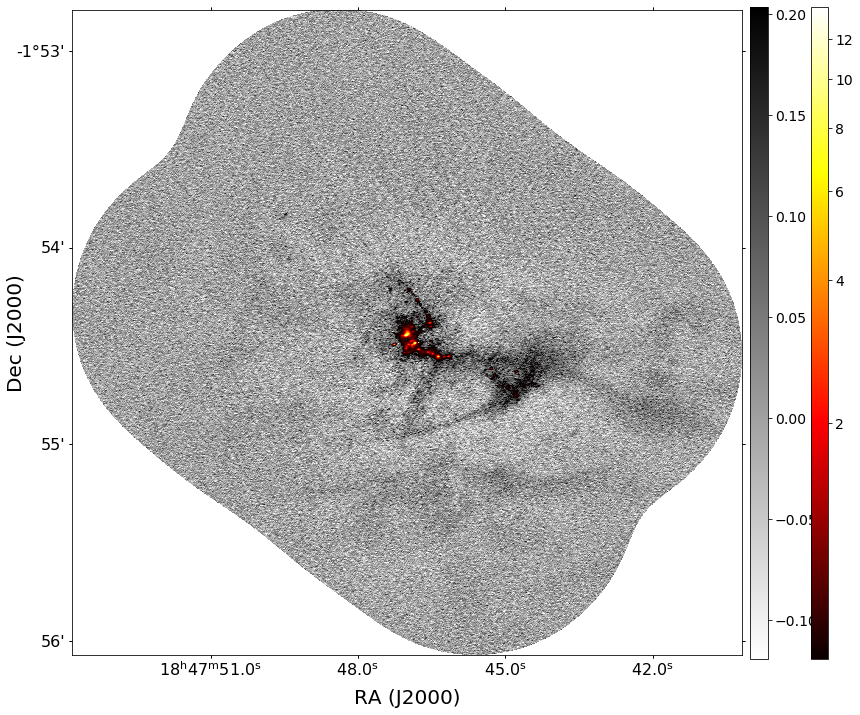

In [312]:
make_multifig(fieldid, band='B3')

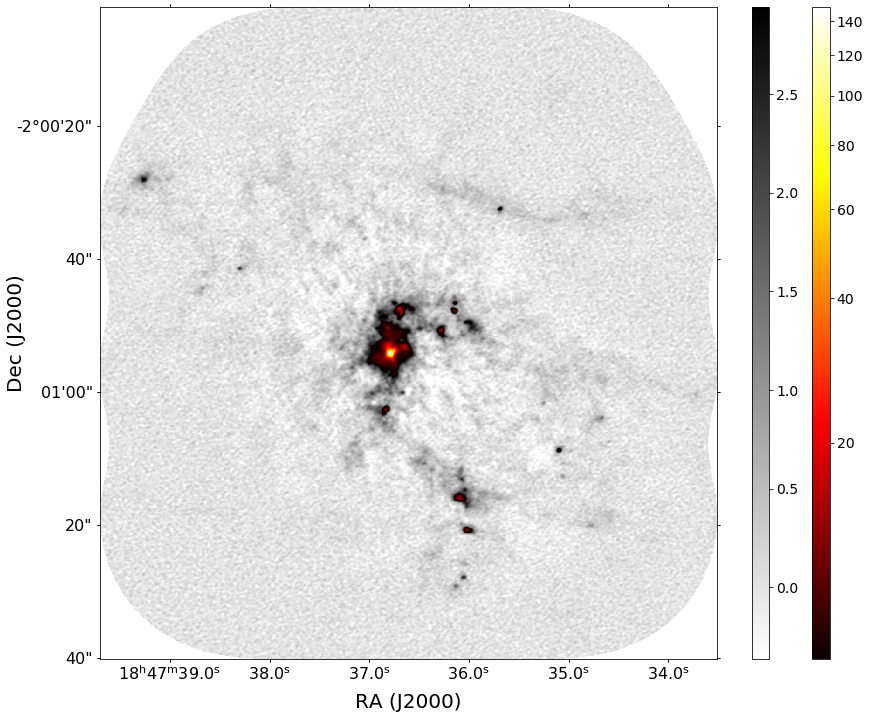

In [313]:
make_multifig(fieldid, band='B6')

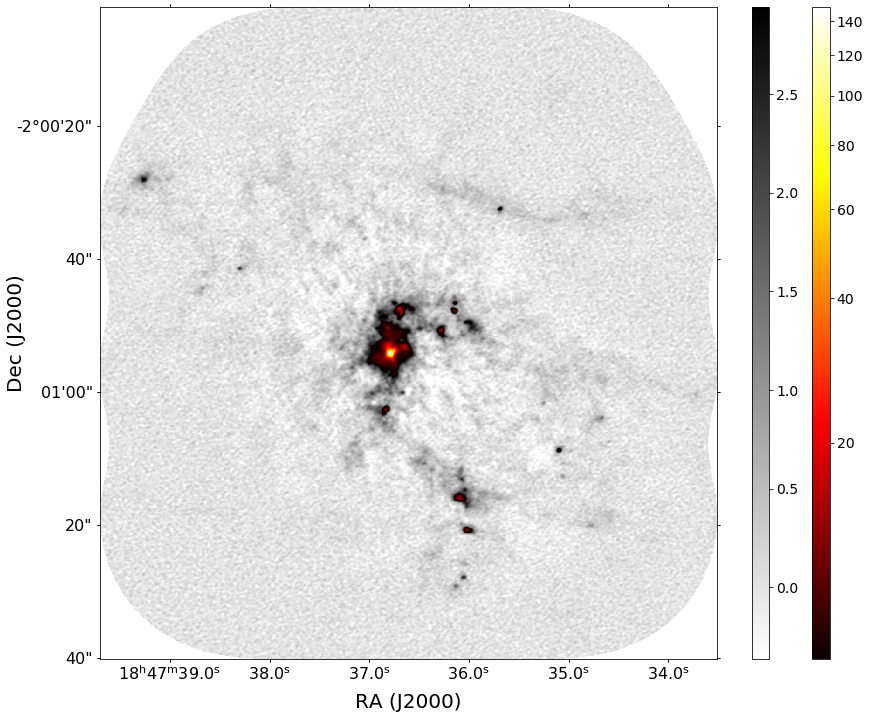

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

<Figure size 864x864 with 0 Axes>

In [314]:
for band in ('B3','B6'):
    for fieldid in prefixes:
        make_multifig(fieldid, band=band)